# Pipeline

See [usage](https://among.github.io/fusus/use/).

See [example](https://github.com/among/fusus/blob/master/example/doExample.ipynb).

How to read this notebook:

1.  *best experience*
    get this repository on your computer and run `jupyter lab`.
    Also install the table of contents extension in Jupyter Lab, since this is a lengthy notebook
    You can run the code cells now.
1.  *good reading experience*
    read it on [NbViewer](https://nbviewer.jupyter.org/github/among/fusus/blob/master/example/doExample.ipynb)
1.  *suboptimal*
    read it directly on [GitHub](https://github.com/among/fusus/blob/master/example/doExample.ipynb)
    (long time to load)

# The beginning

Enable autoloading of changed code.

Change the directory to where this notebook resides on disk, i.e. near the book's scanned pages directory.

In [3]:
%load_ext autoreload
%autoreload 2
!cd `pwd`

Import the fusus package.

See [install](https://among.github.io/fusus/about/install.html).

In [4]:
from fusus.book import Book

Initialize the processing line.

In [5]:
B = Book()

# Settings

Learn how to show and edit settings.

Here is the
[documentation](https://among.github.io/fusus/parameters.html)
of all customizable settings.

Inspect the settings, first a single setting, then two, then all.

In [20]:
B.showSettings(params="blurX")

blurX                = 41


In [21]:
B.showSettings(params="blurX,blurY")

blurX                = 41
blurY                = 41


In [22]:
B.showSettings()

accuracy             = 0.8
bandBroad            = (-15, 10)
bandHigh             = (10, 30)
bandInter            = (5, 5)
bandLow              = (-10, -10)
bandMain             = (0, 0)
bandMid              = (10, -5)
blockMarginX         = 12
blurX                = 41
blurY                = 41
boxBorder            = 3
connectBorder        = 4
connectRatio         = 0.1
connectThreshold     = 40000
debug                = 0
inDir                = in
interDir             = inter
marginThreshold2Y    = 15
marginThresholdX     = 1
marginThresholdY     = 8
marksDir             = marks
maxHits              = 5000
outDir               = out
skewBorder           = 30


Change settings.

In [23]:
B.configure(blurX=11, blurY=3)
B.showSettings(params="blurX,blurY")

blurX                = 11
blurY                = 3


Reset individual parameters:

In [24]:
B.configure(blurX=None)
B.showSettings(params="blurX,blurY")

blurX                = 41
blurY                = 3


Reset all parameters:

In [25]:
B.configure(reset=True)
B.showSettings(params="blurX,blurY")

blurX                = 41
blurY                = 41


# Bands

Bands are regions where we look for spots to wipe clean.

See [usage](https://among.github.io/fusus/about/use.html).

Here they are:

In [6]:
B.availableBands()

Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  10, bottom=  -5


## How are the bands computed?

The `main` band is computed directly from the histogram in such a way that almost
all ink of a line falls in it.

The `broad` band is a wider variant of `main`.

The `mid` band is a narrower variant of `main`.

The `inter` band is computed from the histogram in such a way that almost all the
interline space falls in it.

The `high` band is variant of `inter`, so that the upper interlinear space falls in it.

The `low` band is variant of `inter`, so that the lower interlinear space falls in it.

The `top` and `bottom` numbers show how much the top and bottom boundaries have been shifted
with respect to the band they are based on.

A negative value shifts up, a positive value shifts down.

## Customizing bands

If you want to shift the boundaries of the bands,
change the offsets:

Suppose you want to widen the `mid`  band, then you can proceed as follows:

In [27]:
B.configure(bandMid=(20,20))
B.showSettings(params="bandMid")
B.availableBands()

bandMid              = (20, 20)
Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  20, bottom=  20


You can change back to the default:

In [28]:
B.configure(bandMid=None)
B.showSettings(params="bandMid")
B.availableBands()

bandMid              = (10, -5)
Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  10, bottom=  -5


# Marks

There are two parameters involved in finding marks in a band:

*   `acc` (= `accuracy`): float: between 0 and 1: the level of accuracy in matching.
    The lower, the fuzzier the matches.
*   `bw` (= `connectBorder`): integer: border width. In order to avoid false matches of marks,
    a match only counts if there is no ink connection between the match and the region
    around it.
    In order to determine that, an inner and outer border around the match is investigated.
    This parameter is the width of those borders.
*   `r` (= `connectRatio`): float: the level of ink connectedness that is acceptable.

There are fixed defaults for `acc` and `bw` and `r`, but you can change them in various places.

## Customizing marks

Here are the marks for this book, with their current parameter settings.

Marks and their settings
	band [high]
		  1: «a»                  acc=0.8, bw=4, r=0.1


		  2: «footnote1»          acc=0.8, bw=4, r=0.1


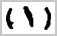

		  3: «footnote2»          acc=0.8, bw=4, r=0.1


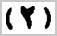

		  4: «footnote3»          acc=0.8, bw=4, r=0.1


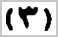

		  5: «footnote4»          acc=0.8, bw=4, r=0.1


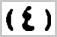

		  6: «footnote5»          acc=0.8, bw=4, r=0.1


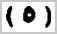

		  7: «footnote6»          acc=0.8, bw=4, r=0.1


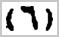

		  8: «footnote7»          acc=0.8, bw=4, r=0.1


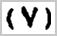

		  9: «footnote8»          acc=0.8, bw=4, r=0.1


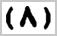

		 11: «shadda.a»           acc=0.8, bw=4, r=0.1


		 10: «shadda.a.2»         acc=0.8, bw=4, r=0.1


		 12: «u»                  acc=0.8, bw=4, r=0.1


		 13: «un»                 acc=0.8, bw=4, r=0.1


	band [low]
		 14: «a»                  acc=0.8, bw=4, r=0.1


		 15: «dash»               acc=0.8, bw=4, r=0.1


	band [mid]
		 16: «bracketClose»       acc=0.8, bw=4, r=0.1


		 17: «bracketOpen»        acc=0.8, bw=4, r=0.1


		 18: «colon»              acc=0.8, bw=4, r=0.1


		 19: «comma»              acc=0.8, bw=4, r=0.1


		 20: «comma2»             acc=0.8, bw=4, r=0.1


		 21: «guillemetClose»     acc=0.8, bw=4, r=0.1


		 22: «guillemetOpen»      acc=0.8, bw=4, r=0.1


		 23: «question»           acc=0.8, bw=4, r=0.1


		 24: «semicolon»          acc=0.8, bw=4, r=0.1


In [7]:
B.availableMarks()

We can customize the defaults:

accuracy             = 0.3
connectBorder        = 8
Marks and their settings
	band [high]
		  1: «a»                  acc=0.3, bw=8, r=0.1


		  2: «footnote1»          acc=0.3, bw=8, r=0.1


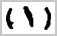

		  3: «footnote2»          acc=0.3, bw=8, r=0.1


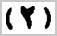

		  4: «footnote3»          acc=0.3, bw=8, r=0.1


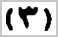

		  5: «footnote4»          acc=0.3, bw=8, r=0.1


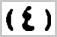

		  6: «footnote5»          acc=0.3, bw=8, r=0.1


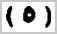

		  7: «footnote6»          acc=0.3, bw=8, r=0.1


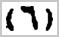

		  8: «footnote7»          acc=0.3, bw=8, r=0.1


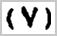

		  9: «footnote8»          acc=0.3, bw=8, r=0.1


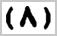

		 11: «shadda.a»           acc=0.3, bw=8, r=0.1


		 10: «shadda.a.2»         acc=0.3, bw=8, r=0.1


		 12: «u»                  acc=0.3, bw=8, r=0.1


		 13: «un»                 acc=0.3, bw=8, r=0.1


	band [low]
		 14: «a»                  acc=0.3, bw=8, r=0.1


		 15: «dash»               acc=0.3, bw=8, r=0.1


	band [mid]
		 16: «bracketClose»       acc=0.3, bw=8, r=0.1


		 17: «bracketOpen»        acc=0.3, bw=8, r=0.1


		 18: «colon»              acc=0.3, bw=8, r=0.1


		 19: «comma»              acc=0.3, bw=8, r=0.1


		 20: «comma2»             acc=0.3, bw=8, r=0.1


		 21: «guillemetClose»     acc=0.3, bw=8, r=0.1


		 22: «guillemetOpen»      acc=0.3, bw=8, r=0.1


		 23: «question»           acc=0.3, bw=8, r=0.1


		 24: «semicolon»          acc=0.3, bw=8, r=0.1


In [30]:
B.configure(accuracy=0.3, connectBorder=8)
B.showSettings(params="accuracy,connectBorder")
B.availableMarks()

We change it back:

accuracy             = 0.8
connectBorder        = 4
Marks and their settings
	band [high]
		  1: «a»                  acc=0.8, bw=4, r=0.1


		  2: «footnote1»          acc=0.8, bw=4, r=0.1


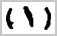

		  3: «footnote2»          acc=0.8, bw=4, r=0.1


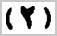

		  4: «footnote3»          acc=0.8, bw=4, r=0.1


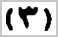

		  5: «footnote4»          acc=0.8, bw=4, r=0.1


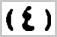

		  6: «footnote5»          acc=0.8, bw=4, r=0.1


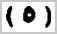

		  7: «footnote6»          acc=0.8, bw=4, r=0.1


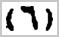

		  8: «footnote7»          acc=0.8, bw=4, r=0.1


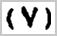

		  9: «footnote8»          acc=0.8, bw=4, r=0.1


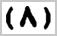

		 11: «shadda.a»           acc=0.8, bw=4, r=0.1


		 10: «shadda.a.2»         acc=0.8, bw=4, r=0.1


		 12: «u»                  acc=0.8, bw=4, r=0.1


		 13: «un»                 acc=0.8, bw=4, r=0.1


	band [low]
		 14: «a»                  acc=0.8, bw=4, r=0.1


		 15: «dash»               acc=0.8, bw=4, r=0.1


	band [mid]
		 16: «bracketClose»       acc=0.8, bw=4, r=0.1


		 17: «bracketOpen»        acc=0.8, bw=4, r=0.1


		 18: «colon»              acc=0.8, bw=4, r=0.1


		 19: «comma»              acc=0.8, bw=4, r=0.1


		 20: «comma2»             acc=0.8, bw=4, r=0.1


		 21: «guillemetClose»     acc=0.8, bw=4, r=0.1


		 22: «guillemetOpen»      acc=0.8, bw=4, r=0.1


		 23: «question»           acc=0.8, bw=4, r=0.1


		 24: «semicolon»          acc=0.8, bw=4, r=0.1


In [31]:
B.configure(accuracy=None, connectBorder=None)
B.showSettings(params="accuracy,connectBorder")
B.availableMarks()

# Pages

The input of the processing line are the scanned pages in the `in` directory.

Let's see what pages we have:

In [8]:
B.availablePages()

    26s 18 pages: 47-48,58-59,63,67,101-102,111-113,121-122,131-132,200,300,400


The easiest thing is to run all pages:

In [40]:
lastPage = B.process()

  0.00s Batch of 18 pages: 47-48,58-59,63,67,101-102,111-113,121-122,131-132,200,300,400
  0.00s Start batch processing images
   |     1.15s     1 047.tif                                 
   |     1.08s     2 048.tif                                 
   |     1.13s     3 058.tif                                 
   |     1.19s     4 059.tif                                 
   |     1.22s     5 063.tif                                 
   |     1.21s     6 067.tif                                 
   |     0.75s     7 101.jpg                                 
   |     1.04s     8 102.jpg                                 
   |     1.15s     9 111.jpg                                 
   |     1.33s    10 112.jpg                                 
   |     1.25s    11 113.jpg                                 
   |     1.11s    12 121.jpg                                 
   |     1.00s    13 122.jpg                                 
   |     1.73s    14 131.jpg                                 
   | 

The workflow returns the last page as the result of the operation.

All pages are logged, with timing and with the percentage of the height of the page at which the footnote mark has been found.

You can also do a selection of pages (and we skip the time consuming OCR step here):

In [9]:
lastPage = B.process(pages="48-60,67", doOcr=False)

  0.00s Batch of 4 pages: 48,58-59,67
  0.00s Start batch processing images
   |     1.15s     1 048.tif                                 
   |     1.25s     2 058.tif                                 
   |     1.25s     3 059.tif                                 
   |     1.29s     4 067.tif                                 
  4.94s all done
  4.94s all done


## Inspection

It is possible to have a closer look.
Let's focus on a single page.

We pass a parameter to turn batch mode off. This will preserve intermediate results, which we can then
inspect.

OCR is included.

In [10]:
page = B.process(batch=False, pages='47')

  0.00s Batch of 1 pages: 47
  0.00s Start batch processing images
   |     4.62s     1 047.tif                                 
  4.63s all done
  4.63s all done


### Inspect intermediate stages

Let's show all stages, but heavily reduced:

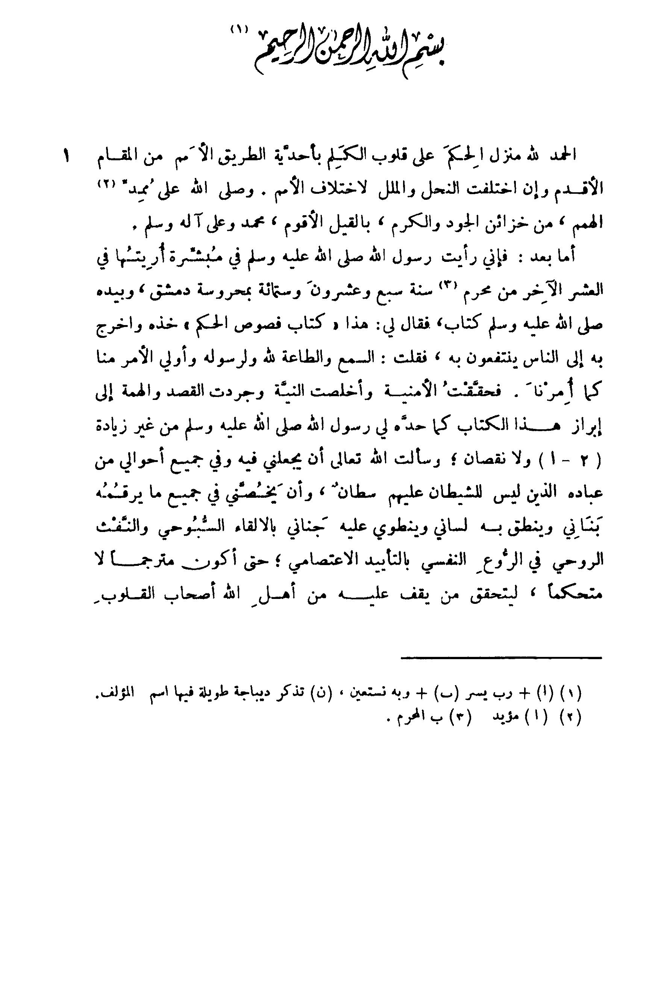

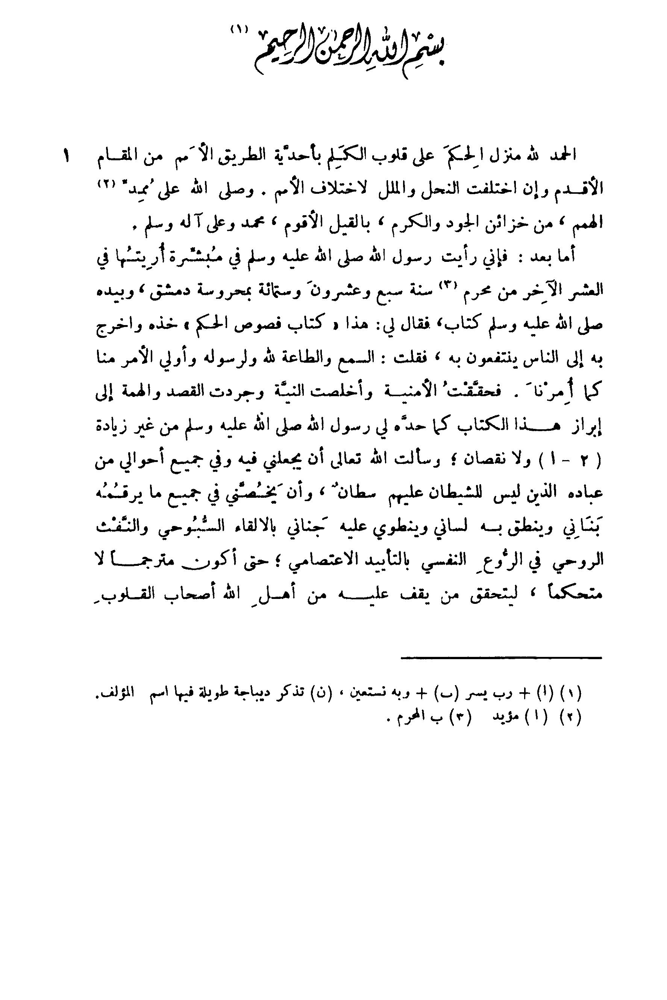

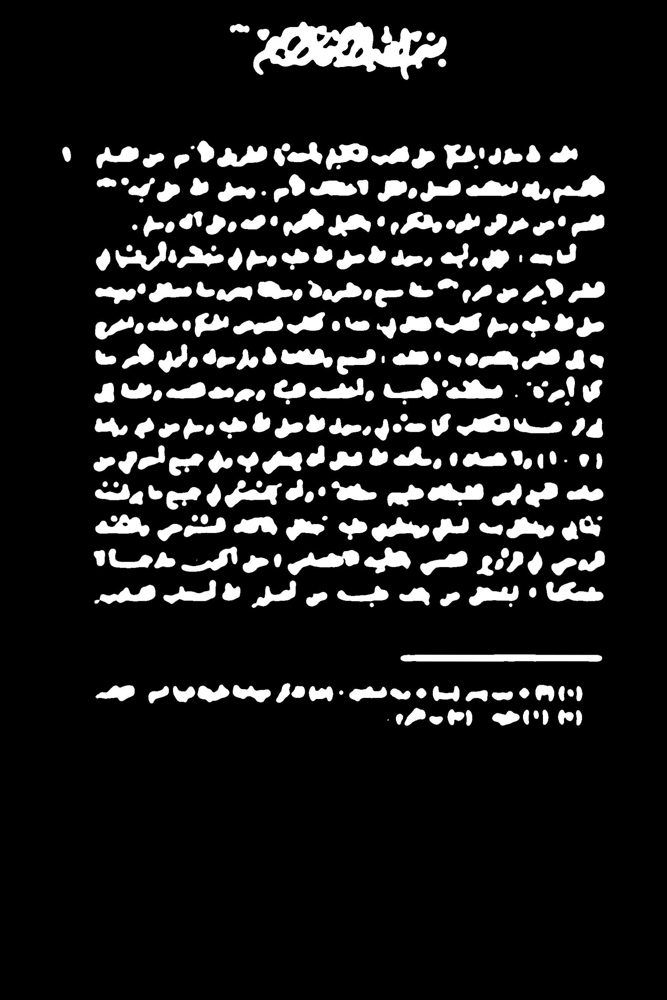

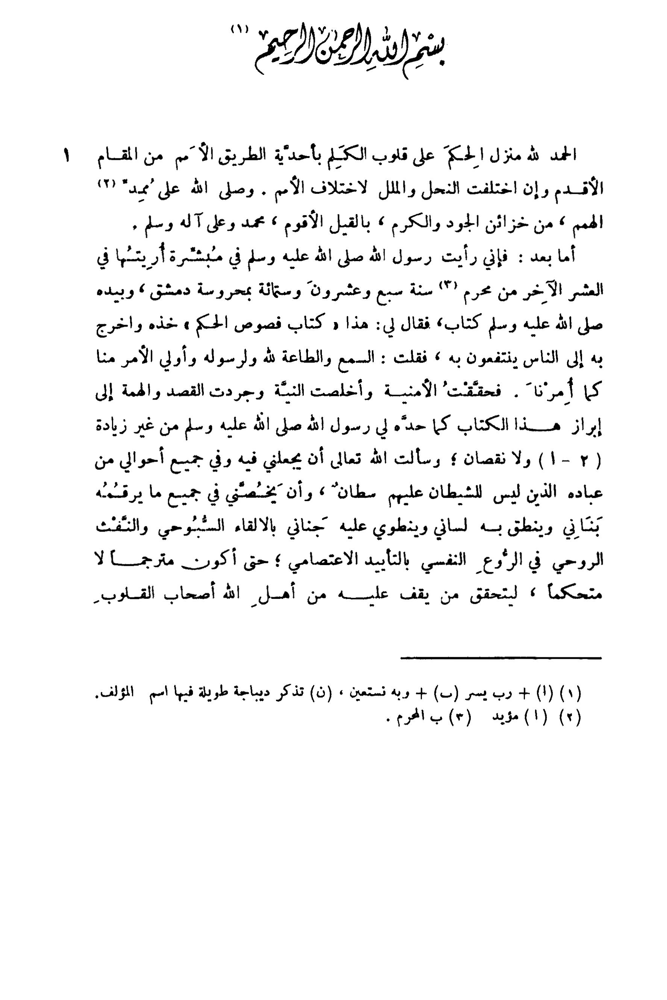

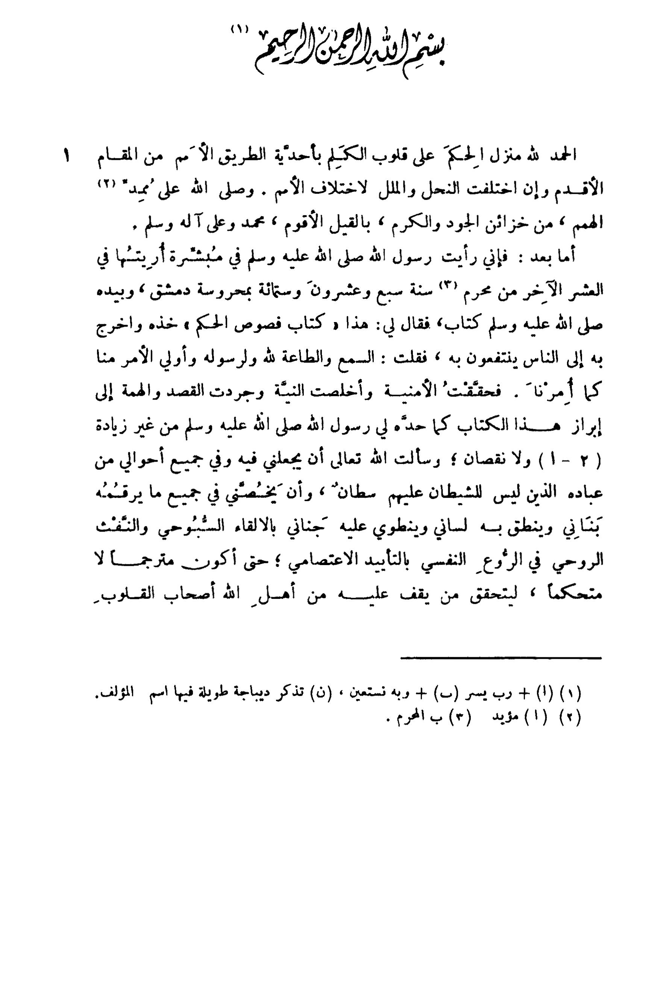

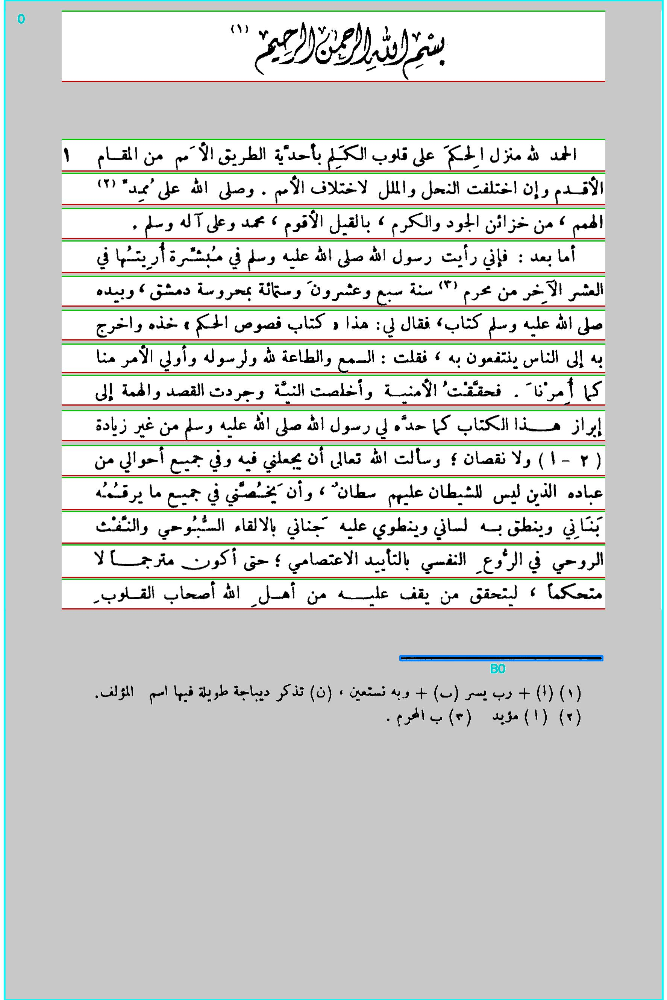

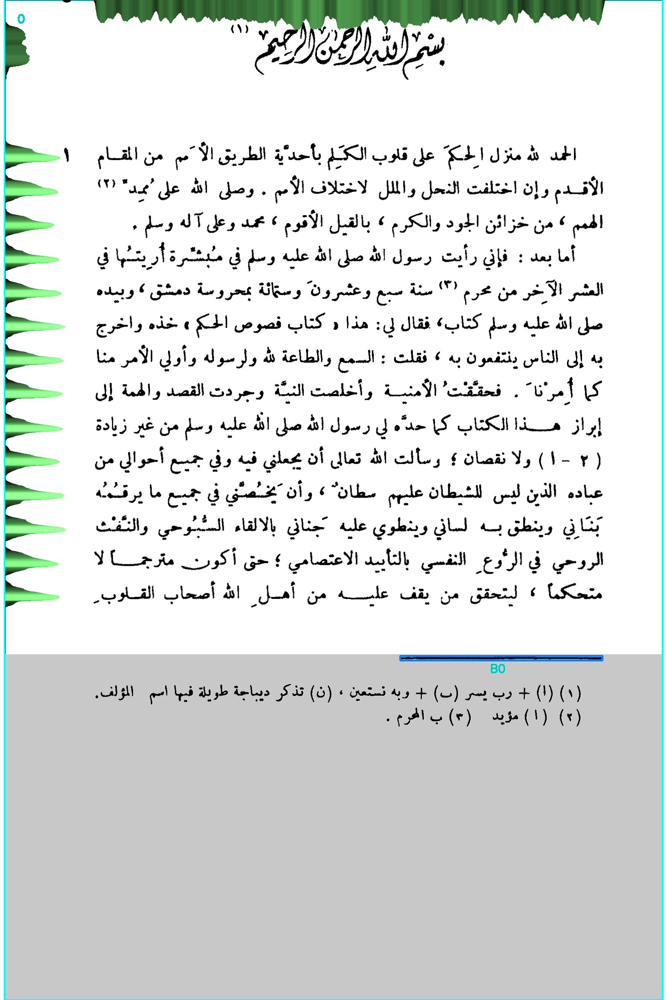

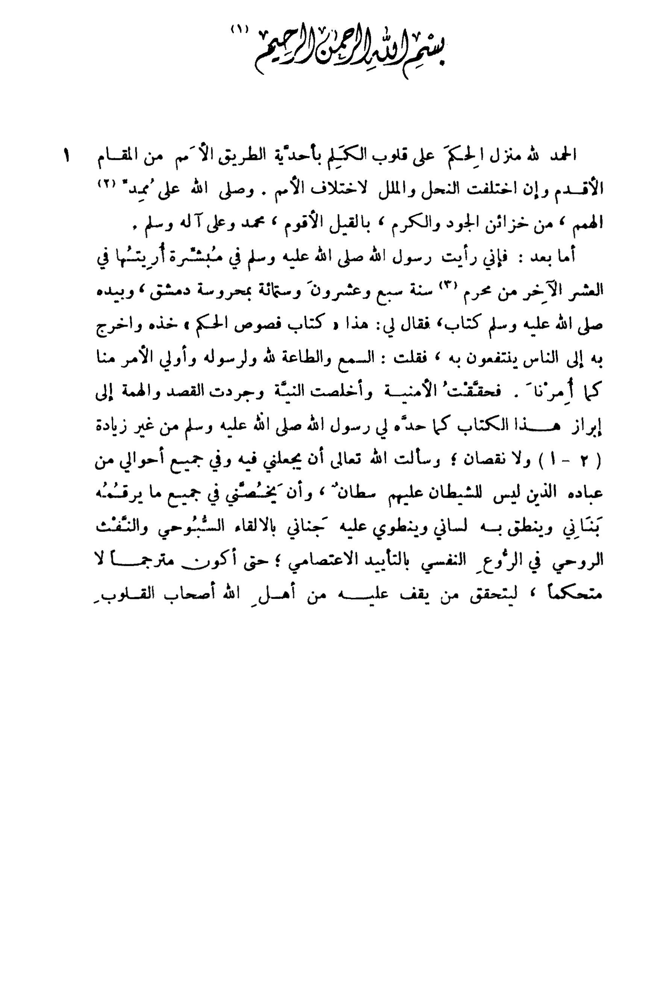

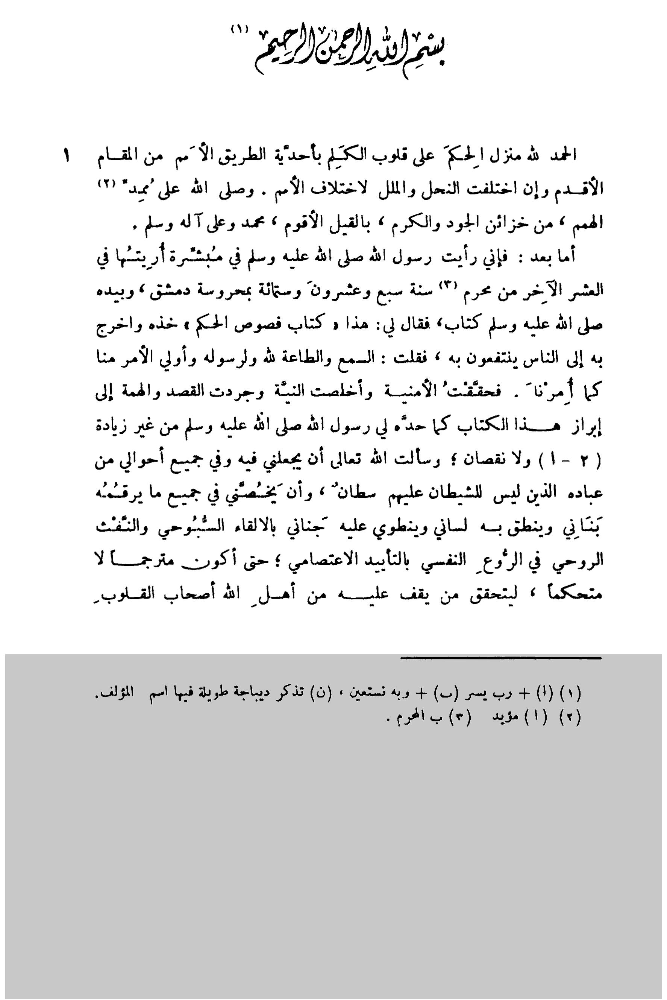

high


   |    1: a                    wiped    7 x, kept    3 x
   |                            kept     3 x
   |      |   wiped [  0] tblr=1368 1384 1553 1577, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1369 1385  852  876, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 742  758  811  835, value= 0.92 conn=0.062 border= 4
   |      |   wiped [  0] tblr=1281 1297  732  756, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 384  400  500  524, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1012 1028 1395 1419, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1369 1385 1583 1607, value= 0.95 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 560  576 1105 1129, value= 0.80 conn=0.188 border= 4
   |      |   kept  [  0] tblr= 382  398  896  920, value= 0.86 conn=0.312 border= 4
   |      |   kept  [  0] tblr= 382  398 1176 1200, value= 0.91 conn=0.208 border= 4


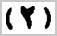

   |    3: footnote2            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 471  503  257  310, value= 0.92 conn=0.000 border= 4


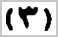

   |    4: footnote3            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 741  774 1165 1219, value= 0.92 conn=0.000 border= 4


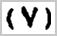

   |    8: footnote7            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 471  503  256  309, value= 0.81 conn=0.000 border= 4


   |   10: shadda.a.2           wiped   13 x, kept    1 x
   |                            kept     1 x
   |      |   wiped [  0] tblr=1287 1308 1235 1257, value= 0.81 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1381 1402  264  286, value= 0.81 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  770  919  941, value= 0.81 conn=0.093 border= 4
   |      |   wiped [  0] tblr= 659  680  519  541, value= 0.81 conn=0.048 border= 4
   |      |   wiped [  0] tblr= 750  771 1548 1570, value= 0.83 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  770  437  459, value= 0.85 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 471  492  322  344, value= 0.87 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1007 1028 1254 1276, value= 0.89 conn=0.045 border= 4
   |      |   wiped [  0] tblr=1276 1297  632  654, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1099 1120 1064 1086, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 381  402  750  

   |   11: shadda.a             wiped   11 x, kept    6 x
   |                            kept     6 x
   |      |   wiped [  0] tblr=1367 1389  292  315, value= 0.82 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 565  587 1317 1340, value= 0.84 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1287 1309 1235 1258, value= 0.87 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1381 1403  264  287, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  771 1548 1571, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 471  493  321  344, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  771  437  460, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1008 1030  743  766, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1099 1121 1063 1086, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1298  632  655, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 380  402  750  

   |   12: u                    wiped    8 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr=1009 1032 1174 1193, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1299  680  699, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 649  672  335  354, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1367 1390  508  527, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 469  492  396  415, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 649  672  559  578, value= 0.96 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1277 1300  299  318, value= 0.96 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1299  270  289, value= 0.97 conn=0.000 border= 4


   |   13: un                   wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr=1276 1300  877  903, value= 0.93 conn=0.000 border= 4
low


   |   14: a                    wiped    5 x, kept    1 x
   |                            kept     1 x
   |      |   wiped [  0] tblr=1066 1081 1497 1519, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 438  453  889  911, value= 0.89 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 797  812 1437 1459, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 437  452 1255 1277, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 526  541  366  388, value= 0.92 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 706  721  386  408, value= 0.85 conn=0.267 border= 4
mid


   |   18: colon                wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 941  972 1011 1028, value= 0.89 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 851  882  997 1014, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 672  703 1376 1393, value= 0.95 conn=0.000 border= 4


   |   21: guillemetClose       wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 849  880  486  507, value= 0.92 conn=0.000 border= 4


   |   22: guillemetOpen        wiped    1 x, kept    8 x
   |                            kept     8 x
   |      |   wiped [  0] tblr= 852  881  883  904, value= 0.95 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 581  610  800  821, value= 0.81 conn=0.207 border= 4
   |      |   kept  [  0] tblr= 849  878  730  751, value= 0.82 conn=0.241 border= 4
   |      |   kept  [  0] tblr=1208 1237  665  686, value= 0.83 conn=0.172 border= 4
   |      |   kept  [  0] tblr=1298 1327  322  343, value= 0.83 conn=0.138 border= 4
   |      |   kept  [  0] tblr=1028 1057 1315 1336, value= 0.84 conn=0.172 border= 4
   |      |   kept  [  0] tblr= 492  521 1546 1567, value= 0.85 conn=0.315 border= 4
   |      |   kept  [  0] tblr= 401  430 1066 1087, value= 0.86 conn=0.138 border= 4
   |      |   kept  [  0] tblr= 670  699 1332 1353, value= 0.86 conn=0.207 border= 4


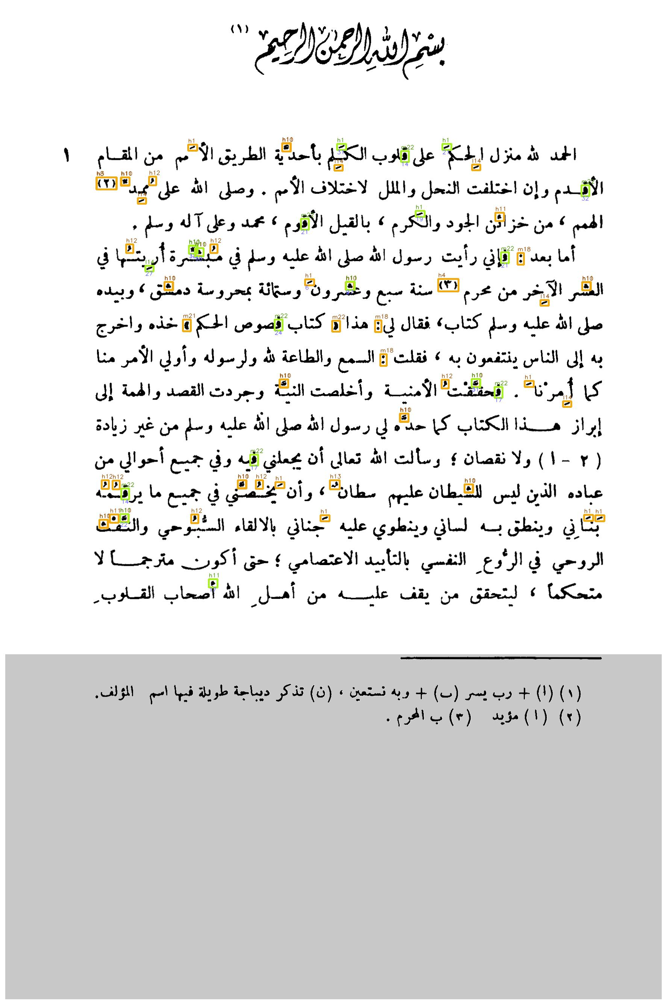

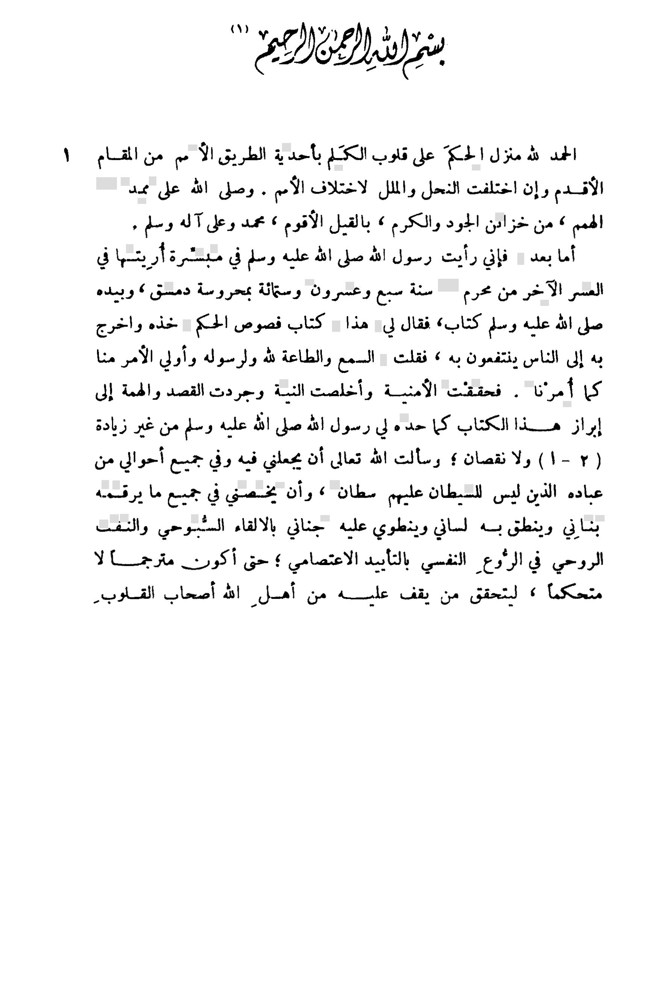

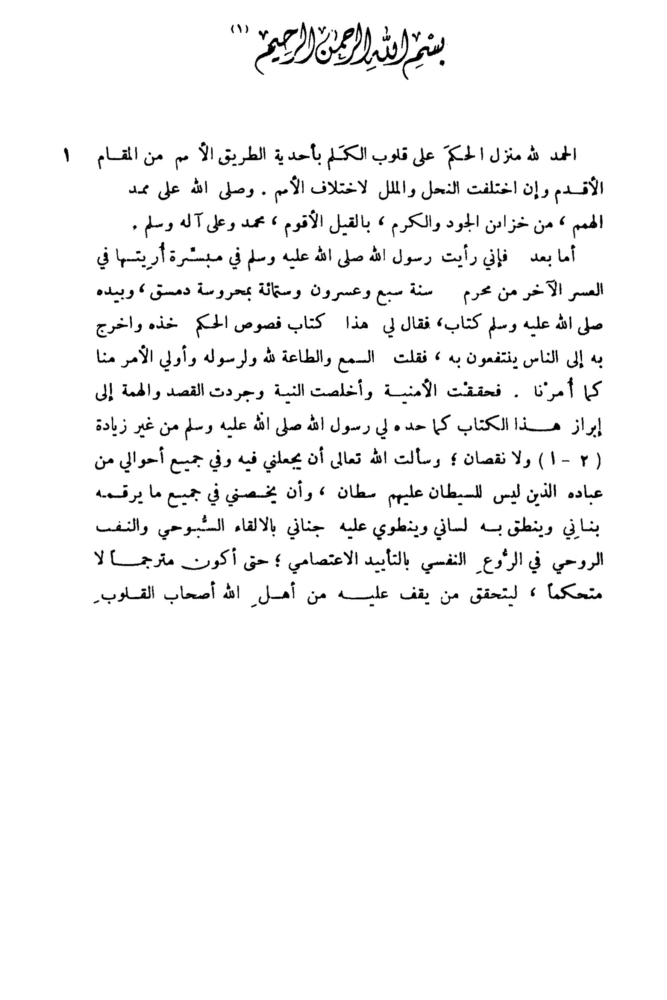

   |      |   BLOCK START 0
   |      |   level	page_num	block_num	par_num	line_num	word_num	left	top	width	height	conf	text
   |      |   1	1	0	0	0	0	0	0	1442	1739	-1	
   |      |   2	1	1	0	0	0	448	59	569	153	-1	
   |      |   3	1	1	1	0	0	448	59	569	153	-1	
   |      |   4	1	1	1	1	0	448	59	569	153	-1	
   |      |   5	1	1	1	1	1	511	59	506	153	0	التبن
   |      |   5	1	1	1	1	2	448	64	43	25	77	"
   |      |   2	1	2	0	0	0	83	377	1355	1238	-1	
   |      |   3	1	2	1	0	0	95	377	1343	257	-1	
   |      |   4	1	2	1	1	0	95	377	1271	76	-1	
   |      |   5	1	2	1	1	1	1299	387	67	40	49	احلد
   |      |   5	1	2	1	1	2	1237	385	30	42	91	هلل
   |      |   5	1	2	1	1	3	1138	392	82	43	45	منزل
   |      |   5	1	2	1	1	4	1014	385	105	66	49	اجلــ&
   |      |   5	1	2	1	1	5	933	392	56	51	93	عىل
   |      |   5	1	2	1	1	6	825	391	92	48	93	قلوب
   |      |   5	1	2	1	1	7	706	384	102	69	32	الكتـ
   |      |   5	1	2	1	1	8	566	381	122	58	89	بأحدية
   |      |   5	1	2	1	1	9	416	387	124	54	93	الطريق
   |      |   5	1	2	

In [52]:
page.show(width=200)

Note the data stages:

*    `markData` with the cleaning data.
*    `ocrData` with the OCR data.

Now the histogram and the cleanh stage at true size;

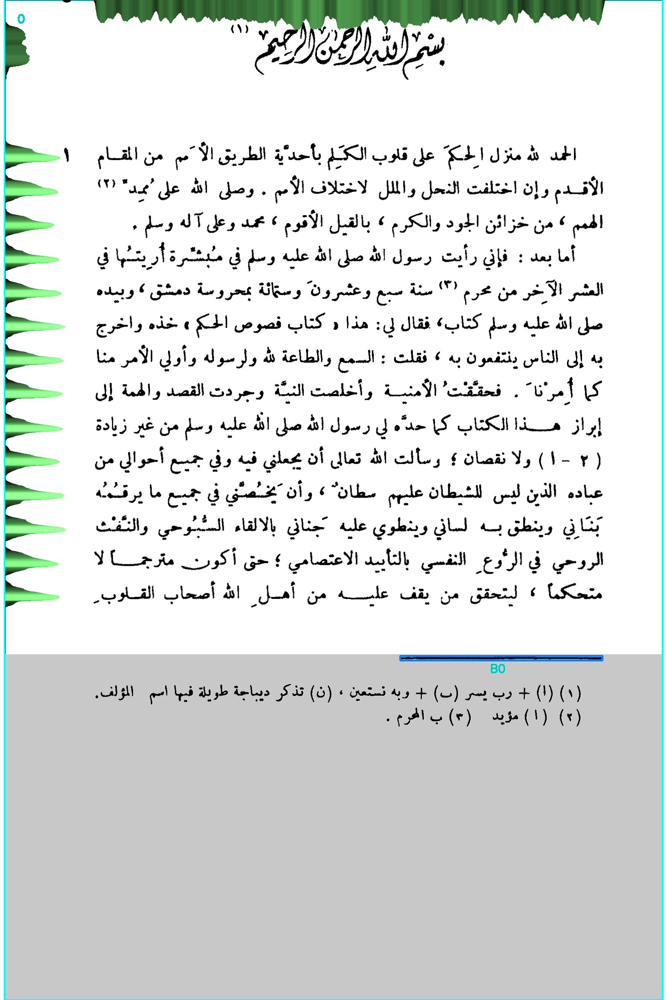

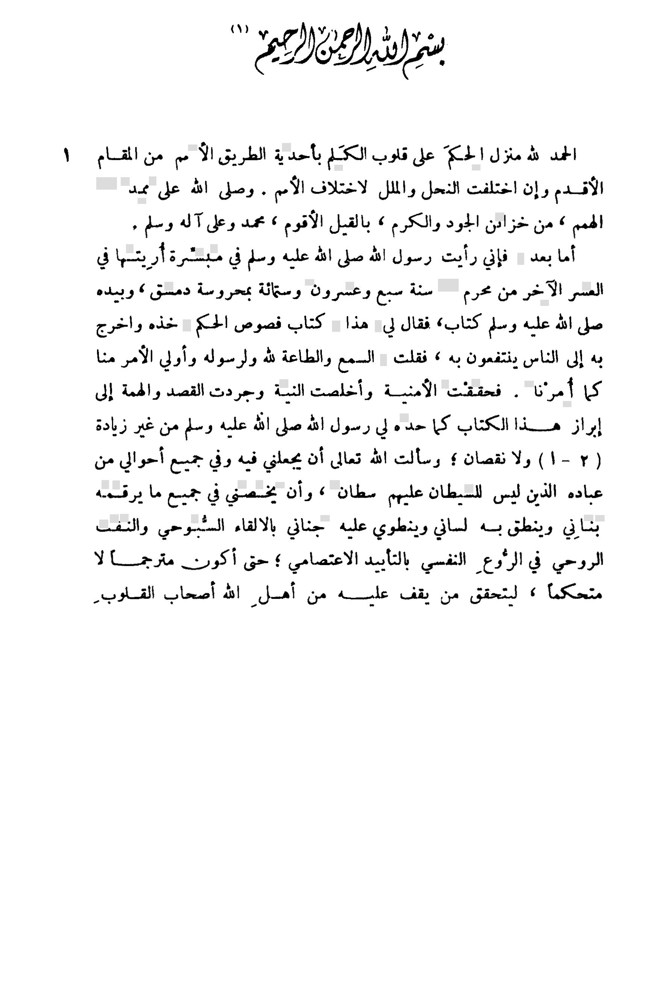

In [53]:
page.show(stage='histogram,cleanh')

The grey rectangles are the traces of wiped marks.

But what goes to the OCR engine is stage `clean`:

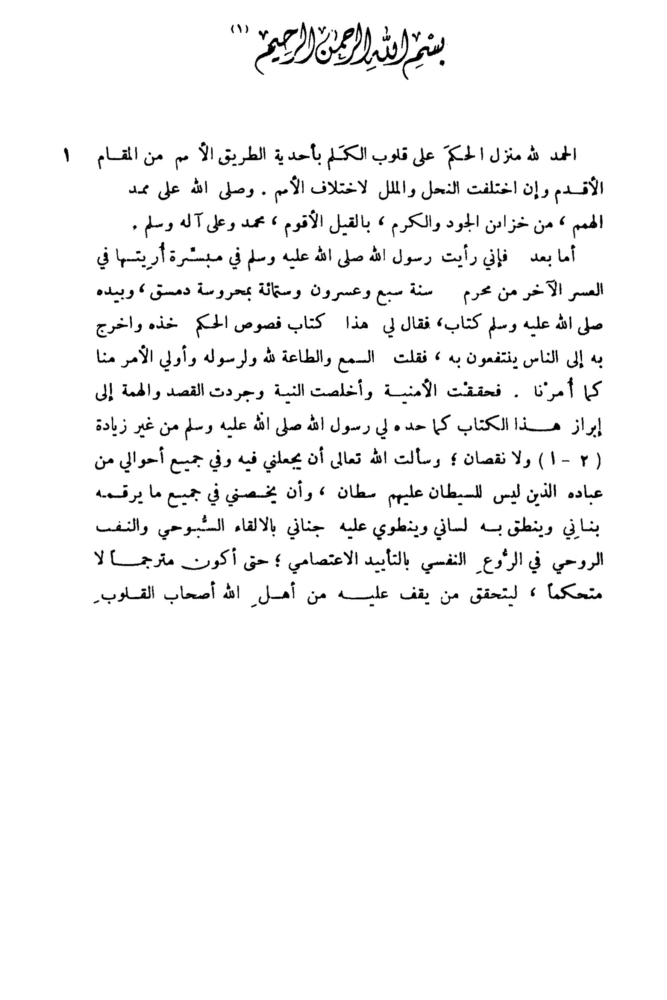

In [54]:
page.show(stage='clean')

### Inspect bands

Let's have a look at all the bands.

We project the bands on the histogram of the page.

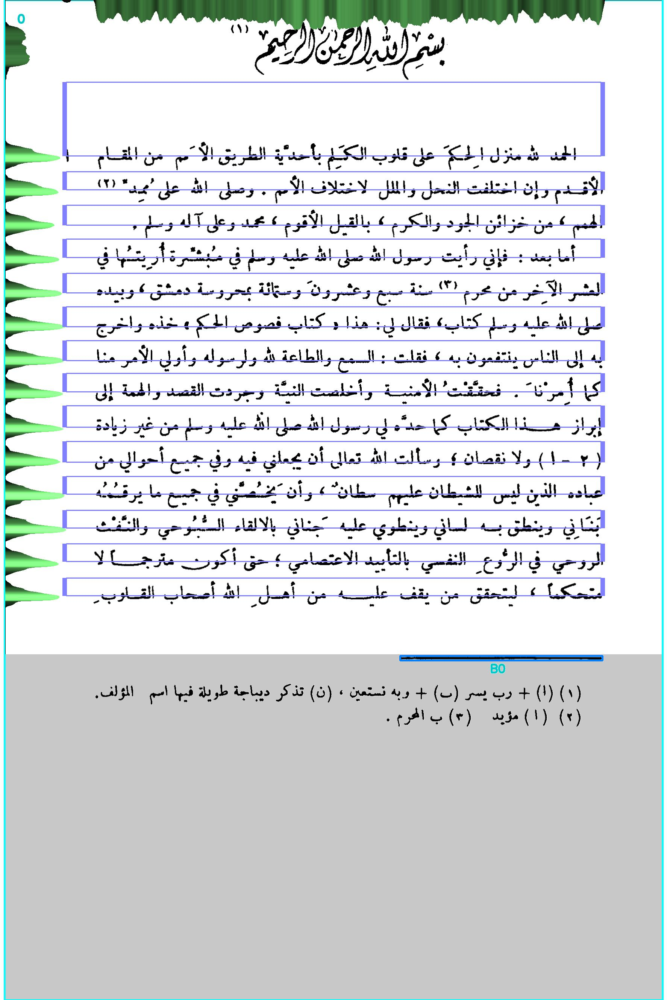

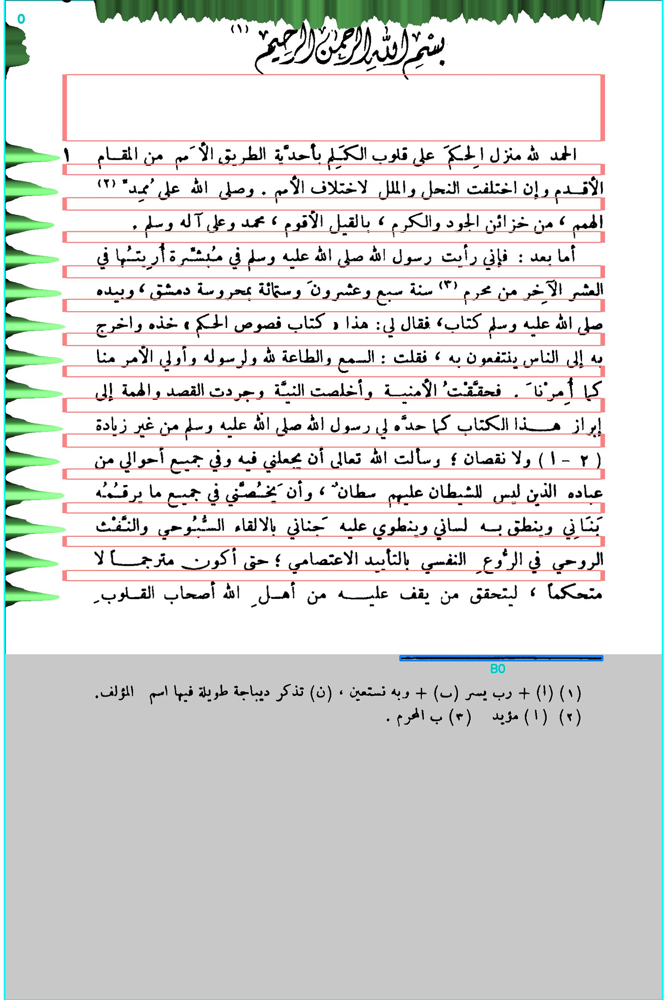

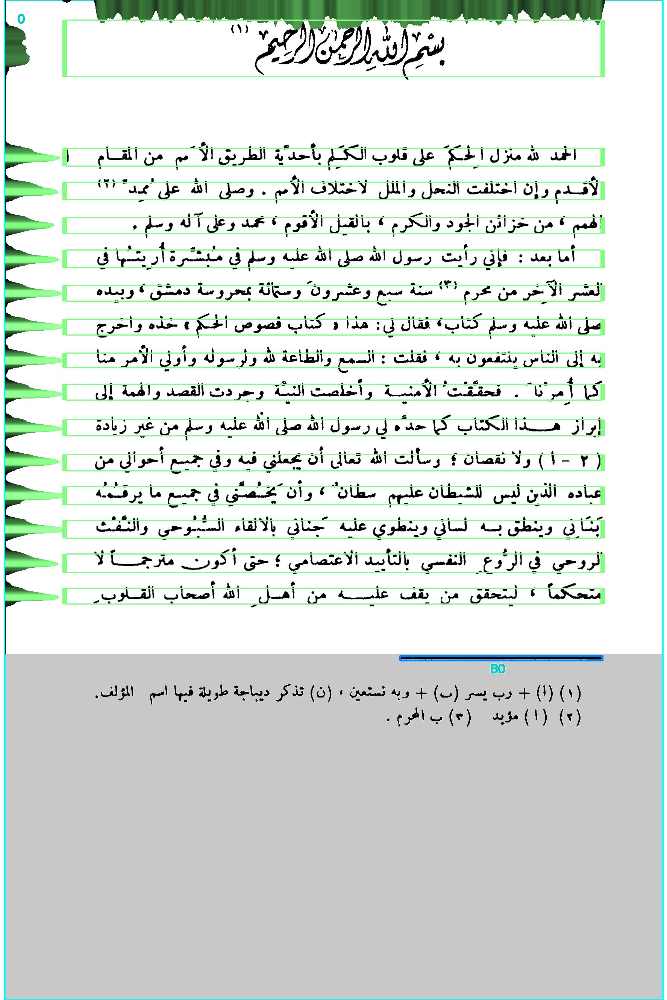

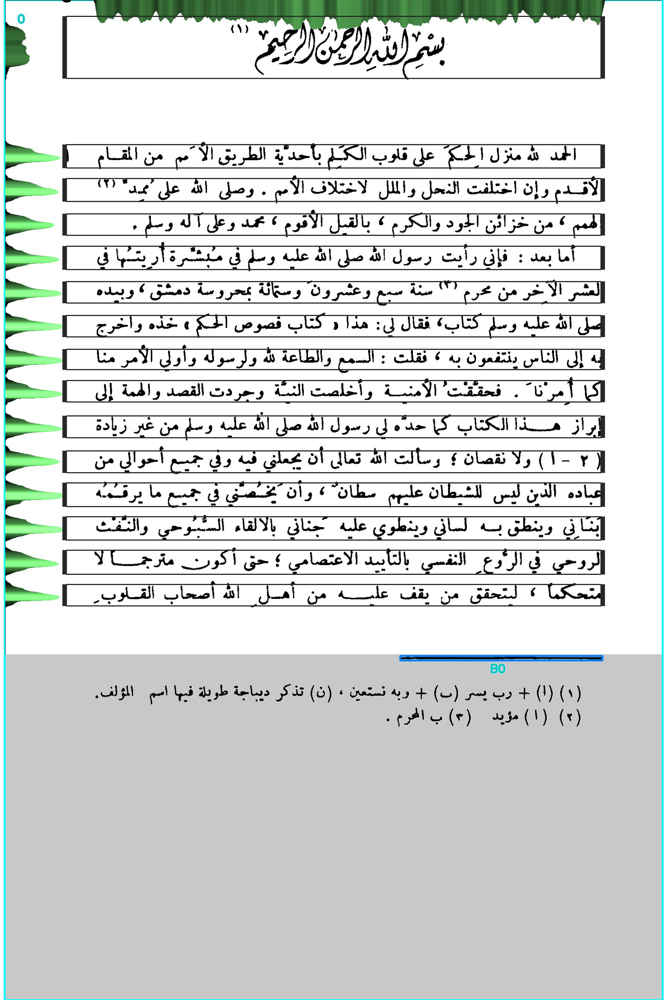

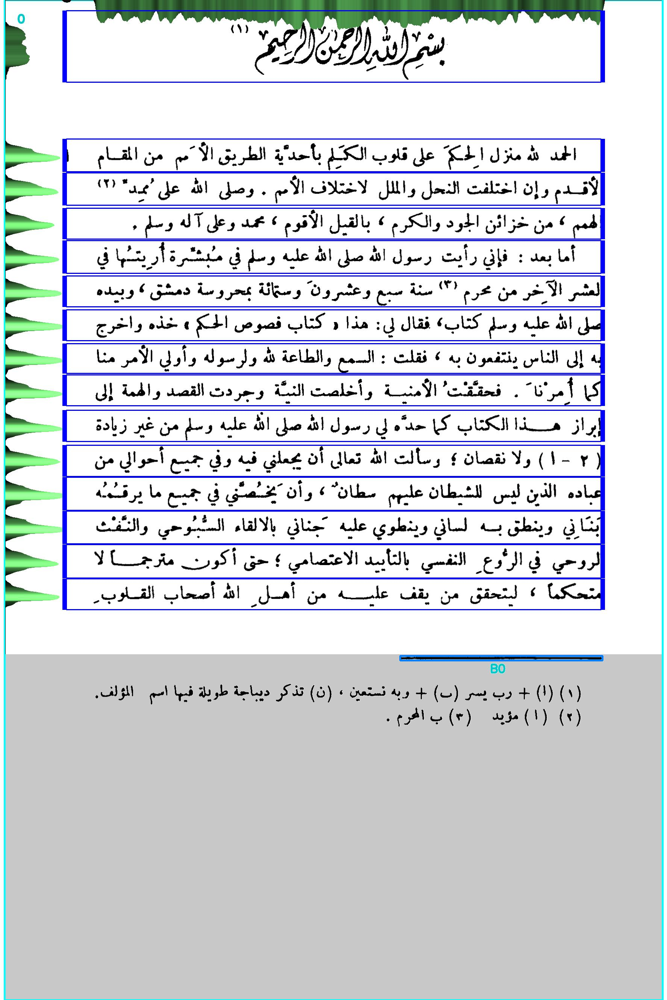

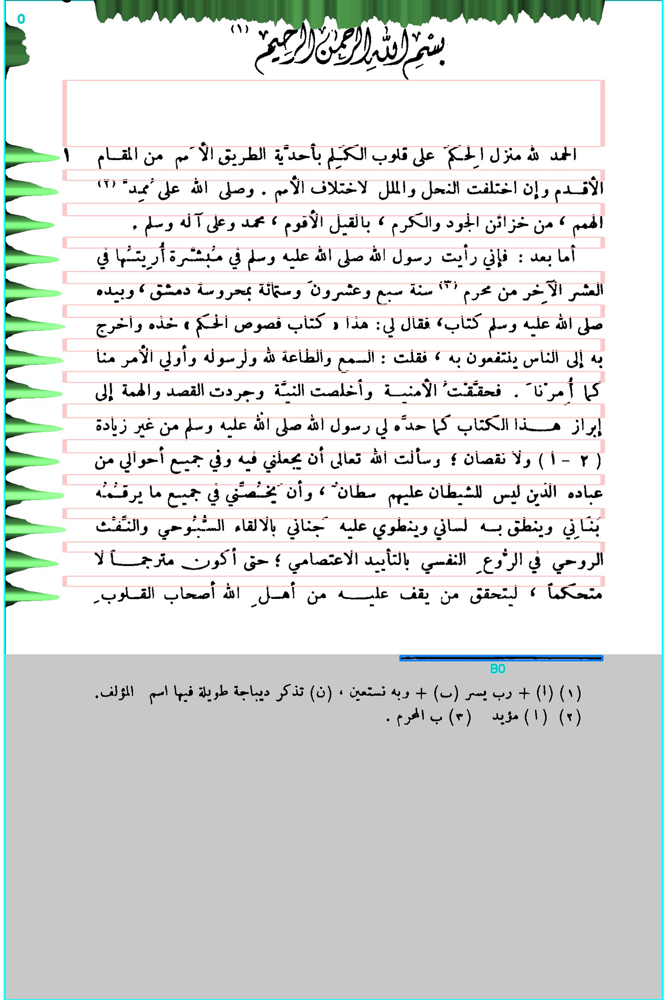

In [55]:
for doBands in ("high", "low", "mid", "main", "broad", "inter"):
    page.show(stage="histogram", band=doBands)

We can also show several bands together:

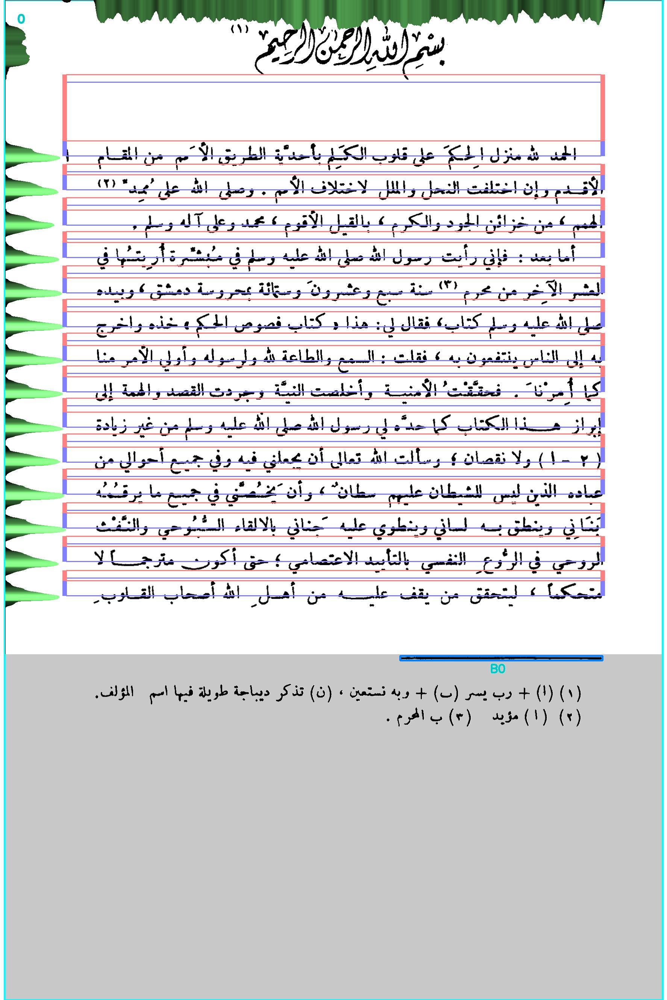

In [56]:
page.show(stage="histogram", band="low,high")

# Cleaning

Proper cleaning requires some interactive adjusting of parameters.
So we need feedback as to what marks have been cleaned and why.

## Connectedness

We can use the `boxed` stage to inspect the results of cleaning.

The letters above the boxes refer to the bands in which those marks are searched:

letter | band
--- | ---
` ` | main
`l` | low
`m` | mid
`h` | high
`b` | broad
`i` | inter

The numbers above the boxes are the numbers of the marks, by running `B.availableMarks()` you see the marks with their numbers.

Marks in *green* boxes will not be removed. 
They are apparently part of a letter, not an isolated blob of ink.

The algorithm computes a degree of connection, and if that is bigger than 0.1, the mark counts as connected.
The connection degrees are printed below the marks (times 100), so 10 is the cutoff value. 
Green marks are always higher than 10.

Marks in *orange* boxes will be removed. 
They have a small connection degree, less than 0.1, but usually much smaller. If it is near zero, it will be left out.

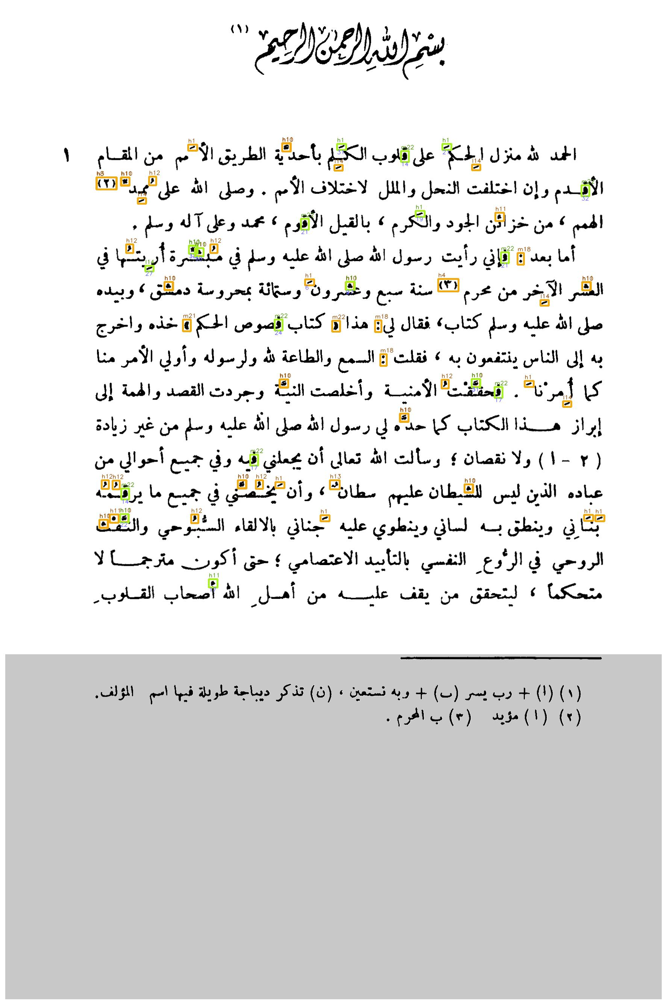

In [57]:
page.show(stage='boxed')

We can also ask for a log of the cleaning process which gives a bit more information:

high


   |    1: a                    wiped    7 x, kept    3 x
   |                            kept     3 x
   |      |   wiped [  0] tblr=1368 1384 1553 1577, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1369 1385  852  876, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 742  758  811  835, value= 0.92 conn=0.062 border= 4
   |      |   wiped [  0] tblr=1281 1297  732  756, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 384  400  500  524, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1012 1028 1395 1419, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1369 1385 1583 1607, value= 0.95 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 560  576 1105 1129, value= 0.80 conn=0.188 border= 4
   |      |   kept  [  0] tblr= 382  398  896  920, value= 0.86 conn=0.312 border= 4
   |      |   kept  [  0] tblr= 382  398 1176 1200, value= 0.91 conn=0.208 border= 4


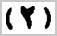

   |    3: footnote2            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 471  503  257  310, value= 0.92 conn=0.000 border= 4


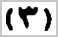

   |    4: footnote3            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 741  774 1165 1219, value= 0.92 conn=0.000 border= 4


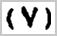

   |    8: footnote7            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 471  503  256  309, value= 0.81 conn=0.000 border= 4


   |   10: shadda.a.2           wiped   13 x, kept    1 x
   |                            kept     1 x
   |      |   wiped [  0] tblr=1287 1308 1235 1257, value= 0.81 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1381 1402  264  286, value= 0.81 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  770  919  941, value= 0.81 conn=0.093 border= 4
   |      |   wiped [  0] tblr= 659  680  519  541, value= 0.81 conn=0.048 border= 4
   |      |   wiped [  0] tblr= 750  771 1548 1570, value= 0.83 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  770  437  459, value= 0.85 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 471  492  322  344, value= 0.87 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1007 1028 1254 1276, value= 0.89 conn=0.045 border= 4
   |      |   wiped [  0] tblr=1276 1297  632  654, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1099 1120 1064 1086, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 381  402  750  

   |   11: shadda.a             wiped   11 x, kept    6 x
   |                            kept     6 x
   |      |   wiped [  0] tblr=1367 1389  292  315, value= 0.82 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 565  587 1317 1340, value= 0.84 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1287 1309 1235 1258, value= 0.87 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1381 1403  264  287, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  771 1548 1571, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 471  493  321  344, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 749  771  437  460, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1008 1030  743  766, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1099 1121 1063 1086, value= 0.92 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1298  632  655, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 380  402  750  

   |   12: u                    wiped    8 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr=1009 1032 1174 1193, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1299  680  699, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 649  672  335  354, value= 0.94 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1367 1390  508  527, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 469  492  396  415, value= 0.95 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 649  672  559  578, value= 0.96 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1277 1300  299  318, value= 0.96 conn=0.000 border= 4
   |      |   wiped [  0] tblr=1276 1299  270  289, value= 0.97 conn=0.000 border= 4


   |   13: un                   wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr=1276 1300  877  903, value= 0.93 conn=0.000 border= 4
low


   |   14: a                    wiped    5 x, kept    1 x
   |                            kept     1 x
   |      |   wiped [  0] tblr=1066 1081 1497 1519, value= 0.88 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 438  453  889  911, value= 0.89 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 797  812 1437 1459, value= 0.90 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 437  452 1255 1277, value= 0.91 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 526  541  366  388, value= 0.92 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 706  721  386  408, value= 0.85 conn=0.267 border= 4
mid


   |   18: colon                wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 941  972 1011 1028, value= 0.89 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 851  882  997 1014, value= 0.93 conn=0.000 border= 4
   |      |   wiped [  0] tblr= 672  703 1376 1393, value= 0.95 conn=0.000 border= 4


   |   21: guillemetClose       wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped [  0] tblr= 849  880  486  507, value= 0.92 conn=0.000 border= 4


   |   22: guillemetOpen        wiped    1 x, kept    8 x
   |                            kept     8 x
   |      |   wiped [  0] tblr= 852  881  883  904, value= 0.95 conn=0.000 border= 4
   |      |   kept  [  0] tblr= 581  610  800  821, value= 0.81 conn=0.207 border= 4
   |      |   kept  [  0] tblr= 849  878  730  751, value= 0.82 conn=0.241 border= 4
   |      |   kept  [  0] tblr=1208 1237  665  686, value= 0.83 conn=0.172 border= 4
   |      |   kept  [  0] tblr=1298 1327  322  343, value= 0.83 conn=0.138 border= 4
   |      |   kept  [  0] tblr=1028 1057 1315 1336, value= 0.84 conn=0.172 border= 4
   |      |   kept  [  0] tblr= 492  521 1546 1567, value= 0.85 conn=0.315 border= 4
   |      |   kept  [  0] tblr= 401  430 1066 1087, value= 0.86 conn=0.138 border= 4
   |      |   kept  [  0] tblr= 670  699 1332 1353, value= 0.86 conn=0.207 border= 4


In [58]:
page.show(stage='markData')

The starred entries correspond to the green boxes.

The connectivity times 100 is the number under the boxes.

Now we only want to see the effects of cleaning for specific marks (in specific bands):

acro,band,mark,hits
h1,high,a,10


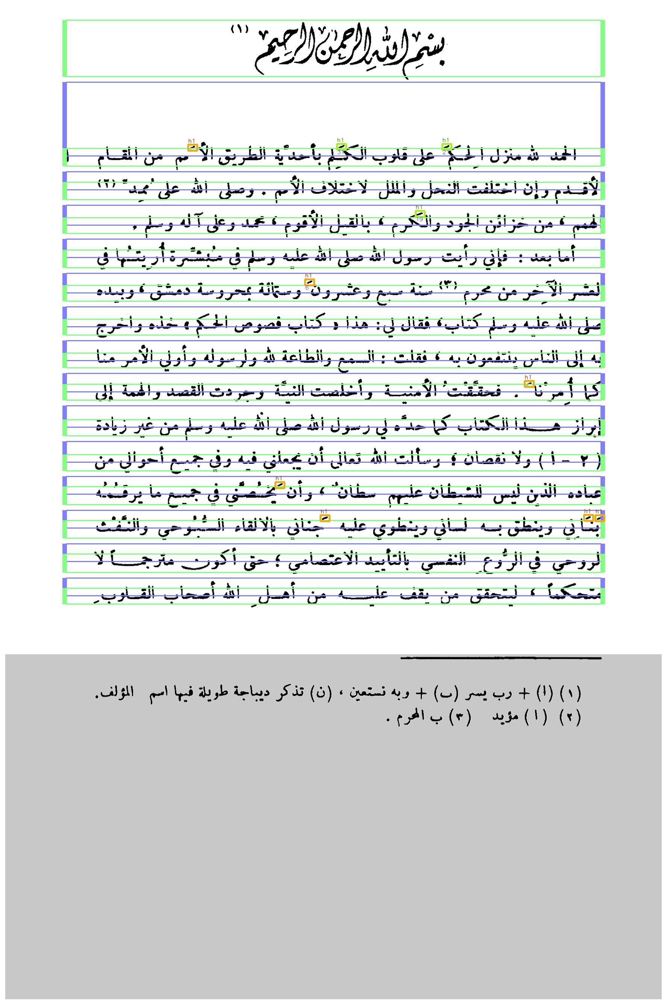

In [61]:
page.show(stage='boxed', band="high,mid", mark="comma,a")

## Cleaning parameters

The parameters that steer the cleaning process are

* `connectBorder`
* `connectRatio`
* `connectThreshold`

See the
[settings specs](https://among.github.io/fusus/parameters.html).